# Pharmacy sales analysis


### Importing libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

### Reading the data

In [3]:
pharma_data = pd.read_csv('saleshourly.csv')
print(pharma_data.head())


            datum  M01AB  M01AE  N02BA  N02BE  N05B  N05C  R03  R06  Year  \
0   1/2/2014 8:00    0.0   0.67    0.4    2.0   0.0   0.0  0.0  1.0  2014   
1   1/2/2014 9:00    0.0   0.00    1.0    0.0   2.0   0.0  0.0  0.0  2014   
2  1/2/2014 10:00    0.0   0.00    0.0    3.0   2.0   0.0  0.0  0.0  2014   
3  1/2/2014 11:00    0.0   0.00    0.0    2.0   1.0   0.0  0.0  0.0  2014   
4  1/2/2014 12:00    0.0   2.00    0.0    5.0   2.0   0.0  0.0  0.0  2014   

   Month  Hour Weekday Name  
0      1     8     Thursday  
1      1     9     Thursday  
2      1    10     Thursday  
3      1    11     Thursday  
4      1    12     Thursday  


### Data Exploration

In [4]:
pharma_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50532 entries, 0 to 50531
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   datum         50532 non-null  object 
 1   M01AB         50532 non-null  float64
 2   M01AE         50532 non-null  float64
 3   N02BA         50532 non-null  float64
 4   N02BE         50532 non-null  float64
 5   N05B          50532 non-null  float64
 6   N05C          50532 non-null  float64
 7   R03           50532 non-null  float64
 8   R06           50532 non-null  float64
 9   Year          50532 non-null  int64  
 10  Month         50532 non-null  int64  
 11  Hour          50532 non-null  int64  
 12  Weekday Name  50532 non-null  object 
dtypes: float64(8), int64(3), object(2)
memory usage: 5.0+ MB


 the datum colum is object and it should be datetime object

In [5]:
pharma_data.describe()

,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06,Year,Month,Hour
count,50532.000000,50532.000000,50532.000000,50532.000000,50532.000000,50532.000000,50532.000000,50532.000000,50532.000000,50532.000000,50532.000000
mean,0.209787,0.162365,0.161723,1.246842,0.368989,0.024736,0.229732,0.120870,2016.401409,6.344811,11.500475
std,0.556003,0.416109,0.453211,2.387392,0.930934,0.217871,1.240513,0.391999,1.664444,3.385761,6.921706
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2014.000000,1.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2015.000000,3.000000,6.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2016.000000,6.000000,12.000000
75%,0.000000,0.000000,0.000000,1.875000,0.000000,0.000000,0.000000,0.000000,2018.000000,9.000000,17.000000
max,7.000000,6.000000,6.500000,29.000000,15.000000,6.000000,25.000000,5.000000,2019.000000,12.000000,23.000000


 Most columns more than 75 percent of them are zeros, so I will need to check their distribution 

In [6]:
px.violin(data_frame=pharma_data.iloc[:,1:9],y=pharma_data.iloc[:,1:9].columns,points=False)

 The distribution seems very skewed

In [7]:
pharma_data.isna().sum()

datum           0
M01AB           0
M01AE           0
N02BA           0
N02BE           0
N05B            0
N05C            0
R03             0
R06             0
Year            0
Month           0
Hour            0
Weekday Name    0
dtype: int64

There are no null values

In [8]:
pharma_data.duplicated().sum()

0

 No duplicates also

### Data Cleaning

 Converting the datum column to datetime type

In [9]:
pharma_data['datum'] = pd.to_datetime(pharma_data.datum)

In [10]:
pharma_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50532 entries, 0 to 50531
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   datum         50532 non-null  datetime64[ns]
 1   M01AB         50532 non-null  float64       
 2   M01AE         50532 non-null  float64       
 3   N02BA         50532 non-null  float64       
 4   N02BE         50532 non-null  float64       
 5   N05B          50532 non-null  float64       
 6   N05C          50532 non-null  float64       
 7   R03           50532 non-null  float64       
 8   R06           50532 non-null  float64       
 9   Year          50532 non-null  int64         
 10  Month         50532 non-null  int64         
 11  Hour          50532 non-null  int64         
 12  Weekday Name  50532 non-null  object        
dtypes: datetime64[ns](1), float64(8), int64(3), object(1)
memory usage: 5.0+ MB


Convert the columns names to more meaningful ones

In [11]:
pharma_data.rename(columns={"M01AB":"NSAIDS_acetic","M01AE":"NSAIDS_propionic","N02BA":"Analgesics_salicylic","N02BE":"Analgesics_pyrazolones_anilides","N05C":"Hypnotics_sedatives","N05B":"Anxiolytics","R03":"OAD_drugs","R06":"Antihistamines"},inplace=True)

set the datum column as index 

In [12]:
pharma_data.set_index('datum',inplace=True)
pharma_data.head()

,NSAIDS_acetic,NSAIDS_propionic,Analgesics_salicylic,Analgesics_pyrazolones_anilides,Anxiolytics,Hypnotics_sedatives,OAD_drugs,Antihistamines,Year,Month,Hour,Weekday Name
datum,,,,,,,,,,,,
2014-01-02 08:00:00,0.0,0.67,0.4,2.0,0.0,0.0,0.0,1.0,2014,1,8,Thursday
2014-01-02 09:00:00,0.0,0.00,1.0,0.0,2.0,0.0,0.0,0.0,2014,1,9,Thursday
2014-01-02 10:00:00,0.0,0.00,0.0,3.0,2.0,0.0,0.0,0.0,2014,1,10,Thursday
2014-01-02 11:00:00,0.0,0.00,0.0,2.0,1.0,0.0,0.0,0.0,2014,1,11,Thursday
2014-01-02 12:00:00,0.0,2.00,0.0,5.0,2.0,0.0,0.0,0.0,2014,1,12,Thursday


Create new columns of the total sales in the pharmacy

In [13]:
pharma_data['Total_sales'] = pharma_data.iloc[:,:8].sum(axis=1)

### Answering questions

#### which hours the pharmacy sales the most?

In [14]:
mean_by_hour = pharma_data.groupby(pharma_data.Hour).agg(np.mean)[pharma_data.columns.to_list()[:8]+['Total_sales']]
px.line(mean_by_hour)

- The plot show that 19 (7 pm) is the hour with highest sales, then comes 20 (8 pm) then 11 am and 12 am. That means those hours are the most crowded hours with customer so the pharmacy should make sure that during this time there are sufficient staff in the pharmacy.

- From the graph we can see that the pharmacy opens 7 am and closes 10 pm, and during the time when it is closed, the sales are recorded as zeros. That is why the hourly data is so skewed and most of the values are zeros 

#### After knowing the reason for the skewness of the data, what is the distribution of the sales by date? 

In [15]:
sales_by_date = pharma_data.groupby(pharma_data.index.date).sum()[pharma_data.columns.to_list()[:8]]

px.violin(sales_by_date,points=False)

#### What are the sales of each category in different weekdays?

In [16]:
mean_by_work_day = pharma_data.groupby('Weekday Name').agg(np.mean)[pharma_data.columns.to_list()[:8]+['Total_sales']]
px.line(mean_by_work_day)

No much difference between the days, but Anxiolytics sales dips in Sundays 

#### What is the most selling category of drugs? 

In [17]:
pie_data = pharma_data.iloc[:,:8].sum().squeeze()
px.pie(names=pie_data.index,values=pie_data.values,)

From the chart we can see that Analgesics were the responsible for around half of the sales. This category have paracetamol and ibuprofen, and those are the most common over the counter drugs.

##### *what is the month with the highest sales?*

In [18]:
sum_by_month = pharma_data.groupby(pharma_data.Month).agg(sum)[pharma_data.columns.to_list()[:8]+['Total_sales']]
px.line(sum_by_month)

It is clear from the graph that January was the month with the highest sales and October comes next

#### Sales trends over time

In [19]:
sales_by_date = pharma_data.groupby(pharma_data.index.date).sum()[['Total_sales']].rolling(30).mean().dropna()
px.line(sales_by_date)

The sales peaks at January and february then dips around march and still relatively low till August. then it increases and peaks again at October and November. After that it decreases in December, and rises to peak at January and repeat the cycle again. That agrees with the previous chart

##### Sales growth

In [34]:
sales_by_date = pharma_data.groupby(pharma_data.index.date).sum()[['Total_sales']].rolling(360,).mean().dropna()
px.line(sales_by_date)

The sales was growing smoothly from 2015 to 2017, but in the 2017/2018 year the sales dipped, then it started recovering in the following year

### Forecasting

##### Reading and preparing the data

In [20]:
daily_sales_total = pd.read_csv('salesdaily.csv').set_index('datum')
daily_sales_total = daily_sales_total.iloc[:,:8].sum(axis=1)

In [21]:
daily_sales_total.index = pd.DatetimeIndex(daily_sales_total.index,)

#### Exploring the seasonality of the data

In [22]:
px.box(data_frame=daily_sales_total,x=daily_sales_total.index.month.to_series(),y=daily_sales_total.values)

the plot show noticeable difference between the months 

##### Testing the stationarity of the data  

In [23]:
from statsmodels.tsa.stattools import adfuller

adtest = adfuller(daily_sales_total, regression='ct', autolag='AIC')
print("P-value = {:.3f}".format(adtest[1]))

P-value = 0.001


In [24]:
from statsmodels.tsa.stattools import kpss
kpss_res = kpss(np.log(daily_sales_total+1), 'ct')
print("P-value = {:.3f}".format(kpss_res[1]))

P-value = 0.010


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2018: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




the both tests resulted in P value less than 0.05 which means that there is a high probability that the data is stationary

#### Exploring the autocorrelation of the total sales

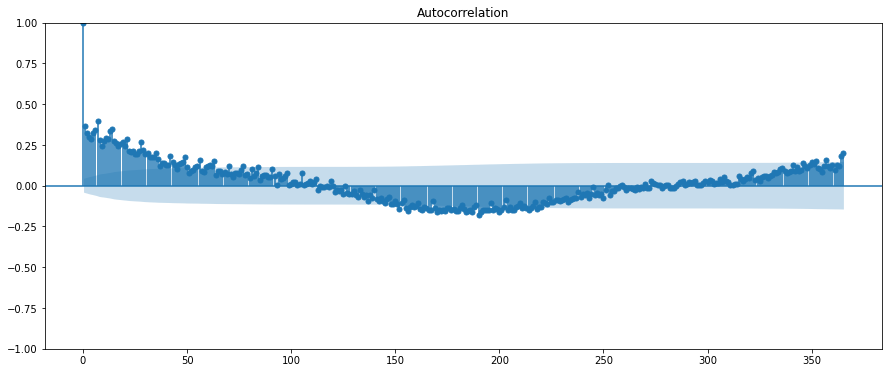

In [25]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
fig,ax = plt.subplots(1,1,figsize=(15,6))
plot_acf(daily_sales_total,lags=365,ax=ax);

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



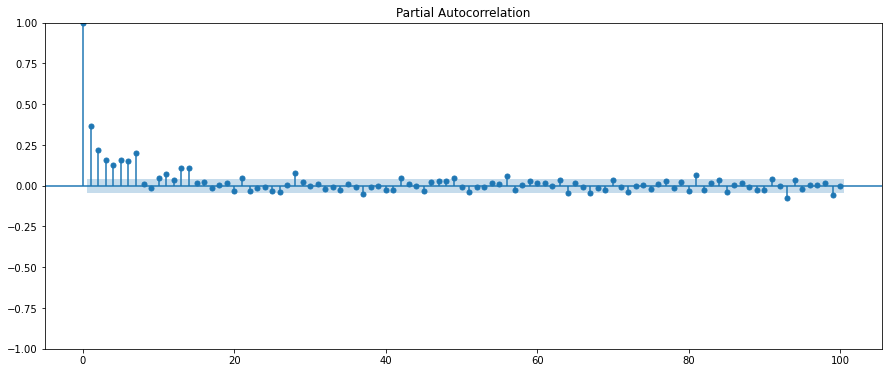

In [26]:
fig,ax = plt.subplots(1,1,figsize=(15,6))
plot_pacf(daily_sales_total,lags=100,ax=ax);

the PCAF chart suggest that their is a correlation between the the time series and seven lags 

##### Model parameters tuning

In [82]:
import statsmodels.api as sm
best_params = sm.tsa.arma_order_select_ic(daily_sales_total+1, max_ar=10, max_ma=5, ic='aic', trend='c');
print(best_params['aic_min_order'],'is the best.')

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

M

(10, 2) is the best.


In [93]:
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.arima.model import ARIMA

def walk_forward_eval(X, order):
    train_size = int(len(X) - 60)
    train, test = X[0:train_size], X[train_size:]
    history = [x for x in train]
    predictions = list()
    for t in range(len(test)):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        output = model_fit.forecast()
        yhat = output[0]
        predictions.append(yhat)
        obs = test[t]
        history.append(obs)
    error = mean_squared_error(test, predictions)
    return error

def grid_search_eval( dataset, p_values, d_values, q_values):
    best_score, best_cfg = float("inf"), None
    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q)
                print(order)
                try:
                    mse = walk_forward_eval(dataset, order)
                    if mse < best_score:
                        best_score, best_cfg = mse, order
                        print(f'the new best order is {order} with mse equals {mse }')
                except Exception as e:
                    pass
    print(' - Best ARIMA%s MSE=%.3f' % (best_cfg, best_score))

p_values = range(0, 6)
d_values = range(0, 2)
q_values = range(0, 6)
grid_search_eval(daily_sales_total.values,p_values,d_values,q_values)

(0, 0, 0)
(0, 0, 1)
(0, 0, 2)
(0, 0, 3)
(0, 0, 4)
(0, 0, 5)
(0, 1, 0)
(0, 1, 1)
(0, 1, 2)
(0, 1, 3)
(0, 1, 4)
(0, 1, 5)
(1, 0, 0)
(1, 0, 1)
(1, 0, 2)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.



(1, 0, 3)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



(1, 0, 4)
(1, 0, 5)
(1, 1, 0)
(1, 1, 1)
(1, 1, 2)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.



(1, 1, 3)
(1, 1, 4)
(1, 1, 5)
(2, 0, 0)
(2, 0, 1)
(2, 0, 2)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



(2, 0, 3)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



(2, 0, 4)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to con

(2, 0, 5)
(2, 1, 0)
(2, 1, 1)
(2, 1, 2)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



(2, 1, 3)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to con

(2, 1, 4)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to con

(2, 1, 5)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to con

(3, 0, 0)
(3, 0, 1)
(3, 0, 2)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



(3, 0, 3)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

M

(3, 0, 4)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to con

(3, 0, 5)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to con

(3, 1, 0)
(3, 1, 1)
(3, 1, 2)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



(3, 1, 3)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to con

(3, 1, 4)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to con

(3, 1, 5)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to con

(4, 0, 0)
(4, 0, 1)
(4, 0, 2)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

M

(4, 0, 3)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to con

(4, 0, 4)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to con

(4, 0, 5)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to con

(4, 1, 0)
(4, 1, 1)
(4, 1, 2)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



(4, 1, 3)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to con

(4, 1, 4)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to con

(4, 1, 5)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to con

(5, 0, 0)
(5, 0, 1)
(5, 0, 2)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

M

(5, 0, 3)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

M

(5, 0, 4)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to con

LU decomposition error.
(5, 0, 5)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to con

(5, 1, 0)
(5, 1, 1)
(5, 1, 2)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



(5, 1, 3)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to con

(5, 1, 4)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to con

(5, 1, 5)


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to con

 - Best ARIMA(5, 0, 0) MSE=152.943


c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



After trying many different parameters configuration the one with the best outcome is p =  , d =  , q =  

#### Evaluating the model

In [126]:
daily_sales_total_values= daily_sales_total.values 
train_size = int(len(daily_sales_total_values) *0.8)
train, test = daily_sales_total_values[0:train_size], daily_sales_total_values[train_size:]
history = [x for x in train]
predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(5,0,0))
    model_fit = model.fit()
    output = model_fit.forecast()
    
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)



<AxesSubplot:xlabel='datum'>

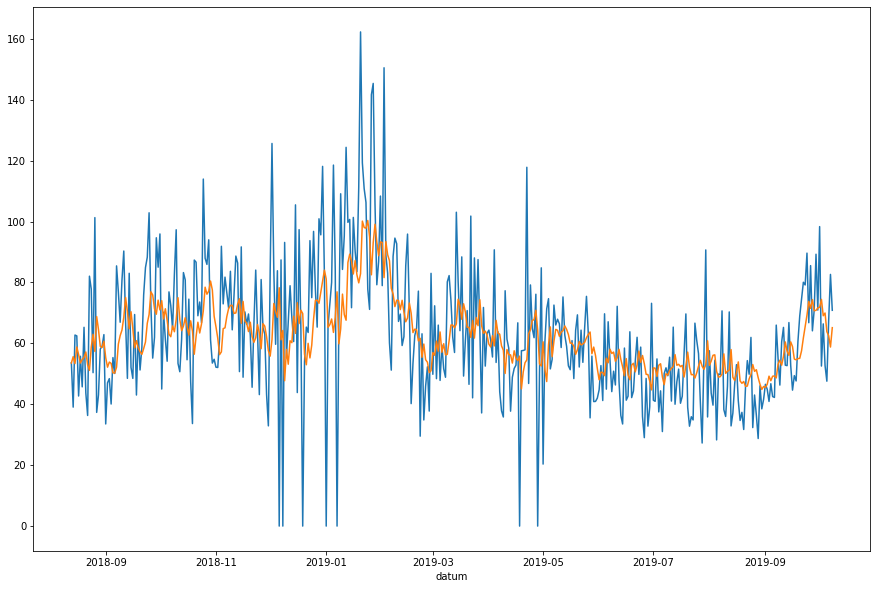

In [127]:
fig,ax = plt.subplots(1,1,figsize=(15,10))
sns.lineplot(y=test,x=daily_sales_total[train_size:].index,ax=ax)
sns.lineplot(y=predictions,x=daily_sales_total[train_size:].index,ax=ax)


From the chart we can see the model is doing fairly good 

In [132]:
mean_squared_error(test,predictions)

408.19733524094687

In [28]:
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.arima.model import ARIMA

daily_sales_total_values= daily_sales_total.values 
train_size = int(len(daily_sales_total_values) *0.8)
train, test = daily_sales_total_values[0:train_size], daily_sales_total_values[train_size:]
history = [x for x in train]
predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(10,0,2))
    model_fit = model.fit()
    output = model_fit.forecast()
    
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)



c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\omar marey\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to con

<AxesSubplot:xlabel='datum'>

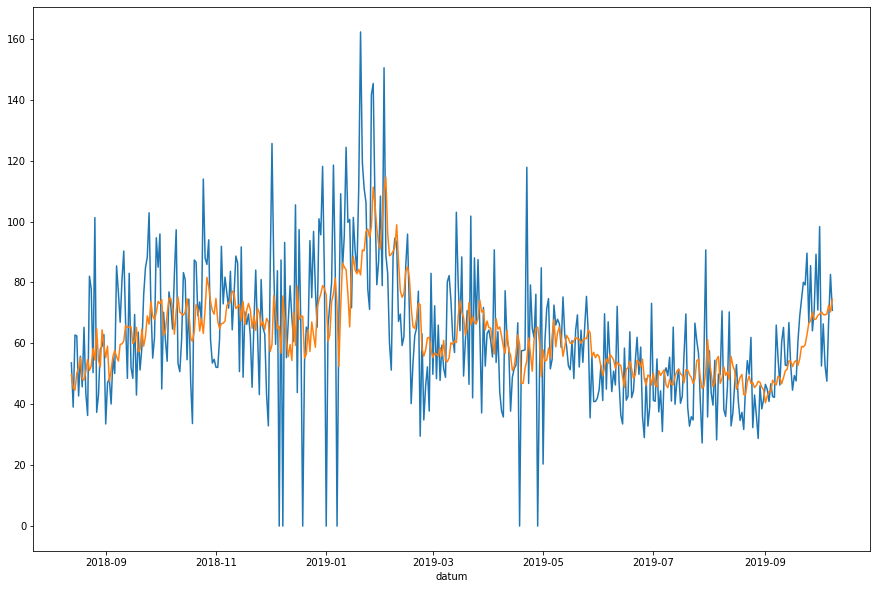

In [29]:
fig,ax = plt.subplots(1,1,figsize=(15,10))
sns.lineplot(y=test,x=daily_sales_total[train_size:].index,ax=ax)
sns.lineplot(y=predictions,x=daily_sales_total[train_size:].index,ax=ax)


In [30]:
mean_squared_error(test,predictions)

384.8732596941957

I used two methods to search for the right parameters the second method is computionaly expensive so I could not search in a bigger space, so I decided to go with the parameter from the first method arma_order_select_ic after I compared the best model resulted from each search. 

## Conclusion
From the analysis I can recommend the pharmacy to:
- design the shifts of the employees to ensure that the highest number of employees present from 10 am to 1 pm and from 6 pm to 8 pm, because those are the time with the highest sales
- Pyrazolones and anilides analgesics make about 50 percent of the sales so make sure to have ongoing supply of them
-  January, February, October, November are the months with the highest sales so the pharmacy should be prepared with enough drugs (Especially Pyrazolones and anilides analgesics) 
- There were a sudden decrease in the sales in the year 2017/2018, this should be investigated to fix the problem or maker sure that it will not happen in the future if that is possible